In [492]:
import os
import re
import sys
from os import listdir
from os.path import isfile, join
from pathlib import Path

import cv2 as cv
import h5py
import matplotlib.pyplot as plt
import numpy as np
import skimage
from skimage import exposure, io
from skimage.util import img_as_ubyte
from tqdm.notebook import tqdm, trange

In [493]:
p_dir = (Path().cwd().parents[0]).absolute()

In [494]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as my_utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Import tof-sims data

In [495]:
from skimage.transform import resize
from sklearn.neighbors import NearestNeighbors

h5_data_dir = p_dir / "data" / "h5"


def get_imgs(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["markers"])
    return imgs, labels


def get_imgs_SIMS(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
        fov = f[name].attrs["fov"]
    return imgs, labels, fov


def get_imgs_index(imgs, index_list, fov_dim):

    imgs_subset = imgs[index_list, :, :]
    img_combined = np.sum(imgs_subset, axis=0)
    img_downscale = resize(img_combined, (fov_dim, fov_dim), anti_aliasing=False)
    return img_downscale


def get_NN(data, n):
    fit = NearestNeighbors(n_neighbors=n).fit(data)
    distances, indices = fit.kneighbors(data)

    return distances, indices


def filter_img_knn(img, n=25, th=3.5):
    # Get avg distances per positive expressed pixels
    x, y = np.where(img > 0)
    values = img[x, y]

    data = np.column_stack((x, y))
    distances, indices = get_NN(data, n)
    # avg_dist = np.average(distances, axis=1, weights=values[indices])
    avg_dist = np.average(distances, axis=1)

    filter_ind = avg_dist > th
    unique, counts = np.unique(filter_ind, return_counts=True)
    print(unique, counts)
    x_fil = x[filter_ind]
    y_fil = y[filter_ind]

    img_fil = img.copy()
    img_fil[x_fil, y_fil] = 0

    return img_fil

In [496]:
core = "L128"
datasets = [core + "_1", core + "_2", core + "_3"]
experiment = "endometrium"

imgs_nuclei_downscale = []
fovs = []
# fov_add = [70,63,50]
fov_add = [70,68,54]

for i, name in enumerate(datasets):
    try:
        imgs, labels, fov = get_imgs_SIMS(experiment, name)
    except:
        continue
    print(fov)
    fov = int(fov) + fov_add[i]
    img_nuclei_downscale = get_imgs_index(imgs, [18, 32], fov_dim=fov)
    p2, p98 = np.percentile(img_nuclei_downscale, (10, 100))
    img_nuclei_downscale = exposure.rescale_intensity(
        img_nuclei_downscale, in_range=(p2, p98), out_range=(0, 255)
    )
    img_nuclei_downscale = img_nuclei_downscale.astype(np.uint8)
    imgs_nuclei_downscale.append(img_nuclei_downscale)
    fovs.append(fov)

414.0625
351.5625
303.051


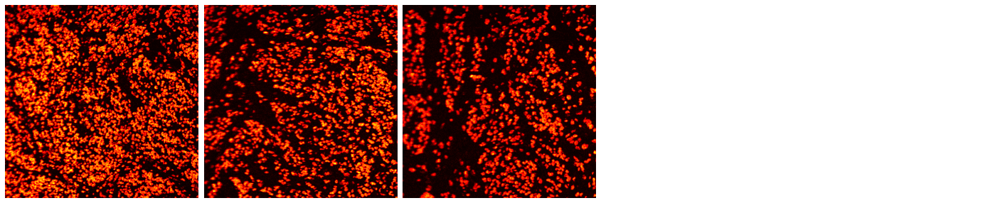

In [497]:
fig, ax = plt.subplots(1, 5, figsize=(25, 5))
ax = ax.flatten()
for i in range(len(ax)):
    try:
        ax[i].imshow(imgs_nuclei_downscale[i], cmap="hot")
    except:
        pass
    ax[i].axis("off")
fig.subplots_adjust(wspace=0.01, hspace=0.01)
plt.show()

# Import IMC data 

In [498]:
from skimage.transform import rotate
import cv2

def get_imgs(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["markers"])
    return imgs, labels


def contrast_stretching(img):
    # Contrast stretching
    p2, p98 = np.percentile(img, (1, 95))
    img_rescale = exposure.rescale_intensity(
        img, in_range=(p2, p98), out_range=(0, 255)
    ).astype(np.uint8)
    return img_rescale

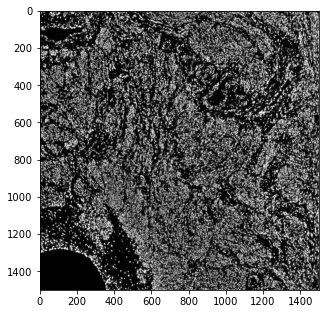

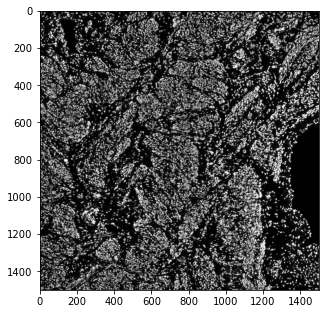

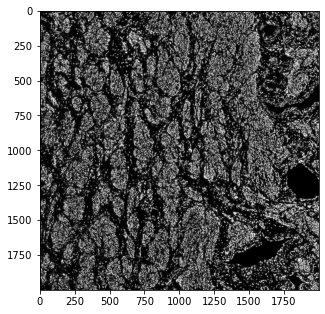

In [499]:
imgs_h3 = []

for dataset in datasets:
    imgs, markers = get_imgs(dataset, "IMC")
    subset = ["DNA1", "DNA2"]

    img_dapi = np.sum(imgs[[markers.index(marker) for marker in subset]], axis=0)
    img_dapi = contrast_stretching(img_dapi)
    
    border = 0
    rotation = -90

    img_h3 = rotate(img_dapi, rotation, resize=True)
    img_h3 = img_as_ubyte(img_h3)
    img_h3 = cv2.copyMakeBorder(img_h3, border, border, border, border, cv2.BORDER_CONSTANT, None, value = 0)

    fig, ax = plt.subplots(figsize=(5, 20))
    ax.imshow(img_h3, cmap="gray")
    plt.show()
    
    imgs_h3.append(img_h3)

In [500]:
# import napari
# viewer = napari.view_image(img_h3)

# Template matching between IMC and Tof-sims data

## Match template 

In [501]:
from typing import Tuple

from skimage.feature import match_template
from skimage.transform import rescale


def match_region(
    source: np.ndarray, template: np.ndarray, show: bool = True, path=None
) -> Tuple[np.ndarray, Tuple[int, int, int, int]]:
    """
    Template matching between source and template
    Return cropped source matching template and bbox of crop region
    """

    # Use template matching
    result = match_template(source, template)

    # Get maximum point of correlation
    ij = np.unravel_index(np.argmax(result), result.shape)
    x, y = ij[::-1]
    h_region, w_region = template.shape

    if show:
        # Plot result
        fig, ax = plt.subplots(figsize=(10, 10))
        ax.imshow(source, cmap=plt.cm.gray)
        ax.set_axis_off()

        # highlight matched region
        rect = plt.Rectangle(
            (x, y), w_region, h_region, edgecolor="r", facecolor="none", lw=3
        )
        ax.add_patch(rect)

    img_crop = source[y : y + h_region, x : x + w_region]

    return img_crop, (y, h_region, x, w_region)

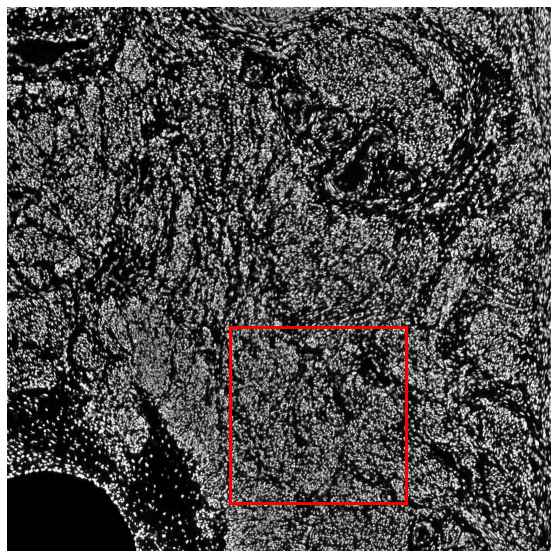

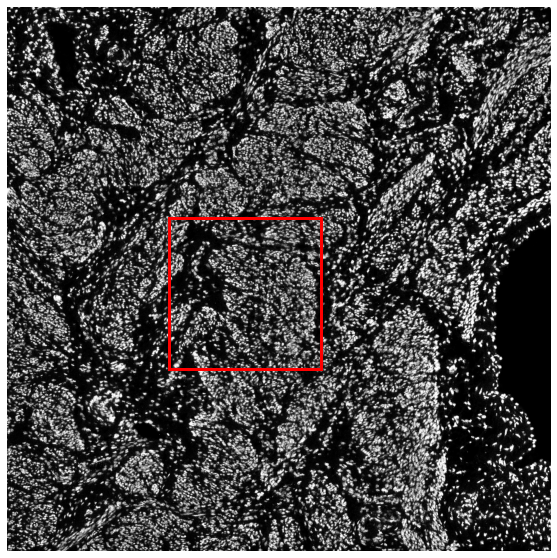

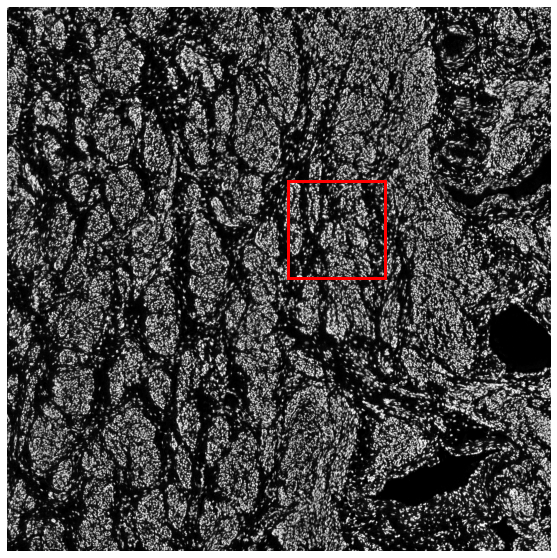

In [502]:
imgs_h3_crop, bbox = map(
    list, zip(*[match_region(img_h3, img) for img_h3, img in zip(imgs_h3, imgs_nuclei_downscale)])
)
plt.show()

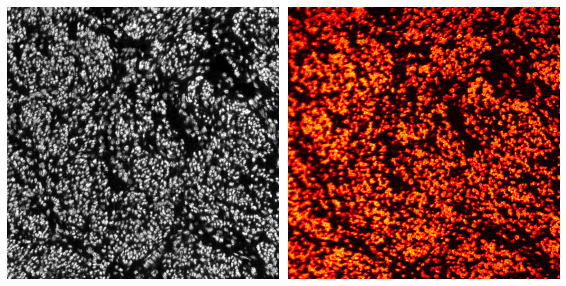

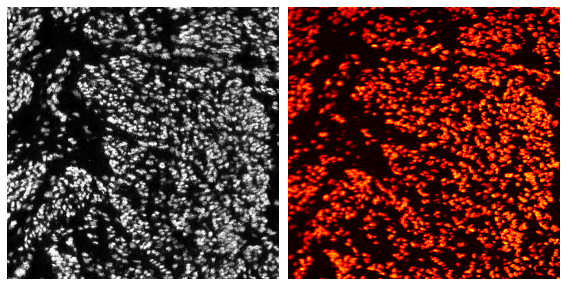

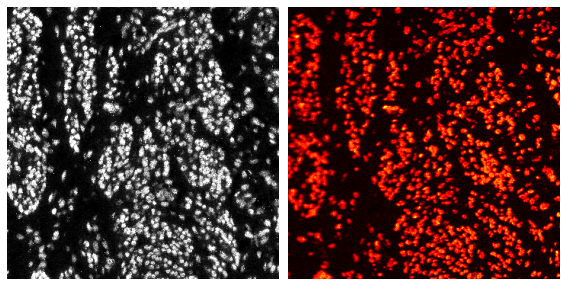

In [503]:
for i in range(len(imgs_h3_crop)):
    fig, ax = plt.subplots(1, 2, figsize=(15, 8))
    ax[0].imshow(imgs_h3_crop[i], cmap="gray")
    ax[1].imshow(imgs_nuclei_downscale[i], cmap="hot")
    ax[0].axis("off")
    ax[1].axis("off")
    fig.subplots_adjust(wspace=0.01)
    plt.show()

## Calculate rotation

In [504]:
from skimage.registration import phase_cross_correlation
from skimage.transform import rescale, rotate, warp_polar


def get_rotation(source: np.ndarray, template: np.ndarray, radius: int = 720) -> int:
    """
    Calculate rotation angle between source and template in degrees
    """

    image_polar = warp_polar(source, radius=radius)
    rotated_polar = warp_polar(template, radius=radius)

    shifts, error, phasediff = phase_cross_correlation(
        image_polar, rotated_polar, upsample_factor=10
    )
    print("Recovered value for counterclockwise rotation: " f"{shifts[0]}")

    return shifts[0]

In [505]:
rotations = [
    get_rotation(img1, img2) for img1, img2 in zip(imgs_h3_crop, imgs_nuclei_downscale)
]
mean_rotation = np.mean(rotations)

Recovered value for counterclockwise rotation: 0.5
Recovered value for counterclockwise rotation: 0.3
Recovered value for counterclockwise rotation: 0.2


# Multiscale resolution check

In [506]:
def match_region_multi(
    source: np.ndarray, template: np.ndarray, show: bool = True
) -> Tuple[np.ndarray, Tuple[int, int, int, int]]:
    """
    Template matching between source and template
    Return cropped source matching template and bbox of crop region
    """
    found = None
    for scale in np.linspace(0.99, 1.0, 40)[::-1]:
        img_downscale = rescale(template, scale, anti_aliasing=True)
        p2, p98 = np.percentile(img_downscale, (0, 100))
        img_downscale = exposure.rescale_intensity(
            img_downscale, in_range=(p2, p98), out_range=(0, 255)
        )
        img_downscale = img_downscale.astype(np.uint8)

        # Use template matching
        result = match_template(source, img_downscale)
        val = np.max(result)
        if found is None or val > found[0]:
            found = (val, result, scale)

    # Get maximum point of correlation
    ij = np.unravel_index(np.argmax(found[1]), result.shape)
    x, y = ij[::-1]
    h_region, w_region = rescale(template, found[2], anti_aliasing=True).shape

    if show:
        # Plot result
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(source, cmap="cividis")
        ax[1].imshow(template, cmap="inferno")
        ax[0].set_axis_off()
        ax[1].set_axis_off()
        fig.subplots_adjust(wspace=0.01)

        # highlight matched region
        rect = plt.Rectangle(
            (x, y), w_region, h_region, edgecolor="r", facecolor="none", lw=3
        )
        ax[0].add_patch(rect)

    img_crop = source[y : y + h_region, x : x + w_region]

    return img_crop, (y, h_region, x, w_region), found[2]

In [507]:
# imgs_h3_r_crop = []
# scales = []
# bboxs_r = []
# for i, img in enumerate(imgs_nuclei_downscale):
#     y, h_region, x, w_region = np.array(bbox[i]) + np.array([-5, 5, -5, 5])
#     r = get_rotation(imgs_h3_crop[i], img)
#     res, bbox_r = match_region(rotate(img_h3[y:y+h_region, x:x+w_region], r), img)
#     bbox_r = bbox_r + np.array([y, 0, x, 0])
#     imgs_h3_r_crop.append(res)
#     scales.append(scale)
#     bboxs_r.append(bbox_r)
#     plt.show()

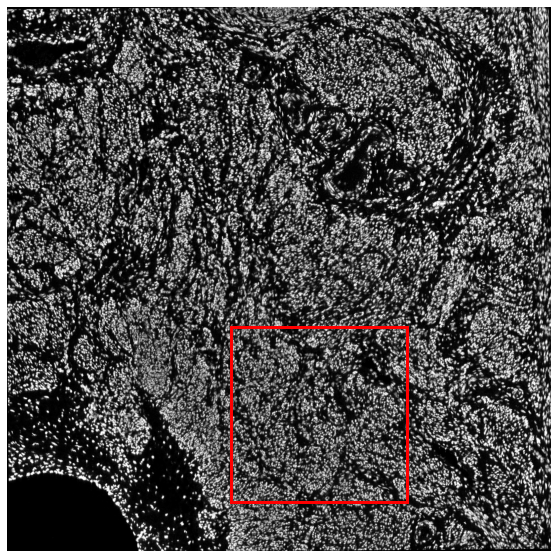

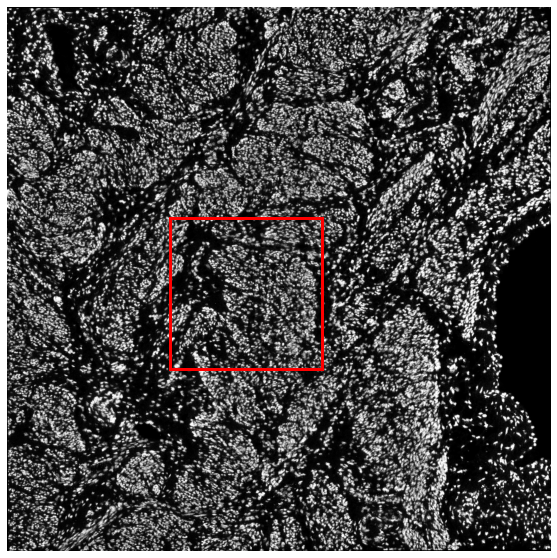

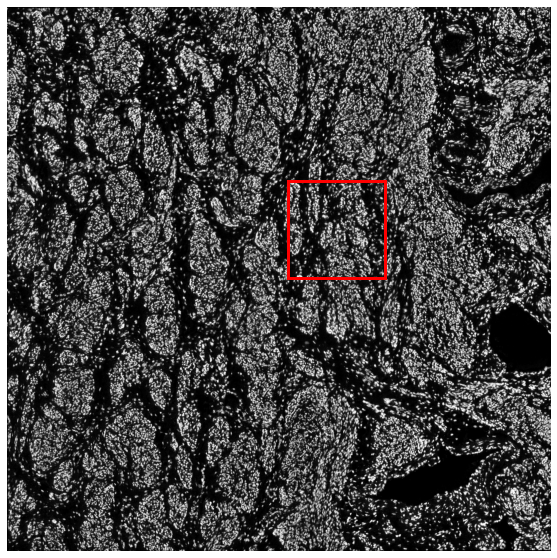

In [508]:
imgs_h3_r_crop = []
bboxs_r = []

for i, img in enumerate(imgs_nuclei_downscale):
    res, bbox_r = match_region(rotate(imgs_h3[i], rotations[i]), img)
    imgs_h3_r_crop.append(res)
    bboxs_r.append(bbox_r)
    plt.show()

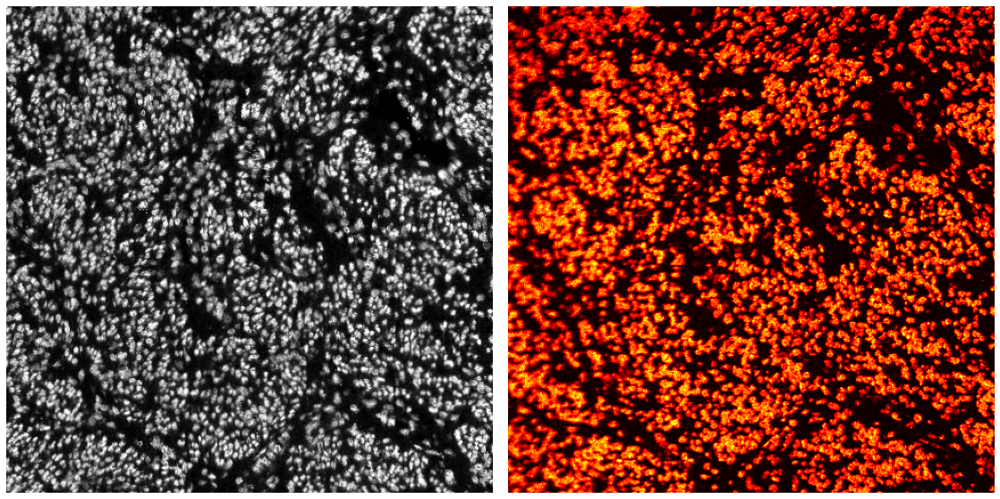

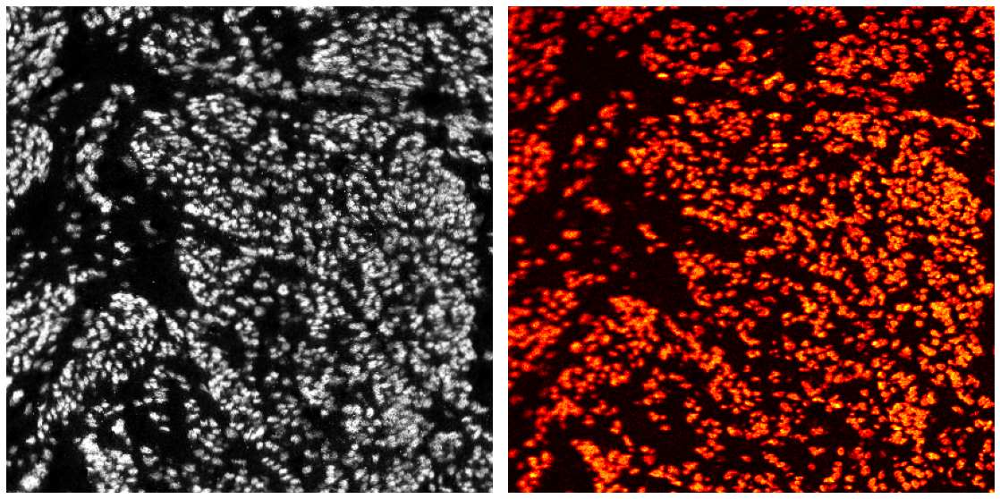

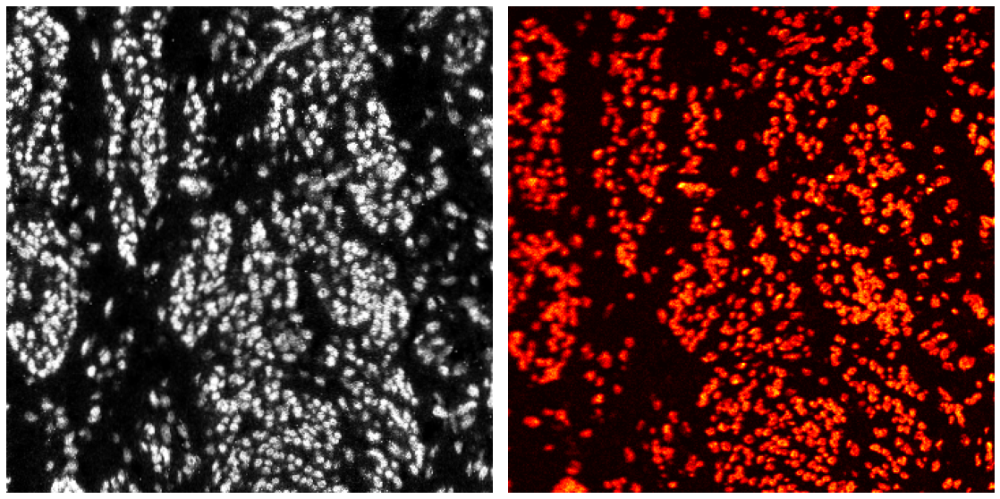

In [509]:
for i in range(len(imgs_h3_r_crop)):
    fig, ax = plt.subplots(1, 2, figsize=(15, 8))
    ax[0].imshow(imgs_h3_r_crop[i], cmap="gray")
    ax[1].imshow(imgs_nuclei_downscale[i], cmap="hot")
    ax[0].axis("off")
    ax[1].axis("off")
    fig.subplots_adjust(wspace=0.01)
    plt.show()

In [487]:
# import napari
# i = 2

# viewer = napari.view_image(imgs_h3_r_crop[i])
# viewer.add_image(imgs_nuclei_downscale[i])

<Image layer 'Image [1]' at 0x2df3ab6b970>

In [387]:
# match_info_dir = p_dir / "data" / "match"

# for i, dataset in enumerate(datasets):
#     info = {
#         "rotation_init": rotation + mean_rotation,
#         "rotation_adjust": 0,
#         "bbox": bboxs_r[i],
#         "dim": fovs[i],
#         "border": border,
#     }
#     my_utils.save_pkl(match_info_dir / f"{experiment}_{dataset}.pickle", info)